# Using CLIP to classify photos of people

This notebook presents classification of famous people from Russia (mostly politicians) based on CLIP zero-short transfer learning capabilities.



# Download and Install CLIP Dependencies

> Indented block

In [1]:
# installing some dependencies, LLaVA was released in PyTorch
import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

# Updated to use a more recent version of PyTorch that supports newer CUDA versions
if CUDA_version in ["10.0", "10.1"]:
    torch_version_suffix = f"+cu{CUDA_version.replace('.', '')}"
elif CUDA_version == "10.2":
    torch_version_suffix = "+cu102"
elif CUDA_version in ["11.0", "11.1", "11.2", "11.3"]:
    torch_version_suffix = "+cu113"  # Assuming cu113 is compatible with CUDA 11.x versions
else:
    torch_version_suffix = "+cu116"  # Defaulting to a newer CUDA version if none of the above match

# Updated PyTorch version to a more recent one that is likely to have the desired CUDA version available
pytorch_version = "1.13.0"  # Example of a more recent version, adjust as needed

torch_version_suffix = "+cu116"  # Your CUDA version suffix

# Choose a compatible torchvision version
torchvision_version = "0.14.0"  # Example compatible version, adjust based on compatibility

%pip install torch=={pytorch_version}{torch_version_suffix} torchvision=={torchvision_version}{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex

import numpy as np
import torch

print("Torch version:", torch.__version__)

CUDA version: 11.5
Defaulting to user installation because normal site-packages is not writeable
Looking in links: https://download.pytorch.org/whl/torch_stable.html
Note: you may need to restart the kernel to use updated packages.
Torch version: 1.13.0+cu116


/home/felinejtd/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
%pip install gdown

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install gradio transformers
import gradio as gr
from transformers import pipeline, BitsAndBytesConfig

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [7]:
quantization_config = BitsAndBytesConfig(load_in_4bit=True, bnb_4bit_compute_dtype=torch.float16)

PackageNotFoundError: No package metadata was found for bitsandbytes

In [8]:
model_id = "llava-hf/llava-1.5-7b-hf"
pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

NameError: name 'quantization_config' is not defined

In [2]:
# clone the LLaVA repository
!git clone https://github.com/haotian-liu/LLaVA.git

import sys
from pathlib import Path

llava_dir = Path(".").absolute() / "LLaVA"
sys.path.append(str(llava_dir))
print(f"LLaVA dir is: {llava_dir}")

import llava

Cloning into 'LLaVA'...
remote: Enumerating objects: 2297, done.
remote: Total 2297 (delta 0), reused 0 (delta 0), pack-reused 2297 (from 1)
Receiving objects: 100% (2297/2297), 13.71 MiB | 3.25 MiB/s, done.
Resolving deltas: 100% (1404/1404), done.
LLaVA dir is: /home/felinejtd/projects/itb/ta/image-alt-text-ai/LLaVA


In [3]:
# Load pre-trained model
import os

device = "cuda" if torch.cuda.is_available() else "cpu"
model, transform = llava.load("llava-hf/llava-1.5-7b-hf", device=device)
print(f"Model dir: {os.path.expanduser('~/.cache/clip')}")

AttributeError: module 'llava' has no attribute 'load'

# Obtain the data

We will use a couple of photos, which I manually downloaded from the internet. Photos show three different persons (2 female, 1 male) and there are 4 to 6 images of each person.
Photos are stored in folders named `Donald`, `Elena` and `Svetlana`. However, we will try CLIP with various names to see the effect.

In [10]:
!gdown https://drive.google.com/uc?id=1sGcW7XsiwvnuRMbeIeQJZCeM9D6R6m_O
!unzip clip_people.zip; rm clip_people.zip

Downloading...
From: https://drive.google.com/uc?id=1sGcW7XsiwvnuRMbeIeQJZCeM9D6R6m_O
To: /home/felinejtd/projects/itb/ta/image-alt-text-ai/clip_people.zip
100%|██████████████████████████████████████| 2.87M/2.87M [00:00<00:00, 4.40MB/s]
Archive:  clip_people.zip
   creating: clip_people/
   creating: clip_people/Donald/
 extracting: clip_people/Donald/2.jpg  
 extracting: clip_people/Donald/3.jpg  
 extracting: clip_people/Donald/4.jpg  
 extracting: clip_people/Donald/93cff841b630c47dd55c.jpg  
 extracting: clip_people/Donald/ezgif-3-8bd4c099df50.jpg  
 extracting: clip_people/Donald/ezgif-3-a3137b1ec3ba.jpg  
   creating: clip_people/Elena/
 extracting: clip_people/Elena/1550606477_701561d4aefa6c271b85916f73fbf073.jpg  
 extracting: clip_people/Elena/238125337.jpg  
 extracting: clip_people/Elena/528px-Valentina_Matviyenko_(7)_(cropped).jpg  
 extracting: clip_people/Elena/D3nQOKWWwAAlkXL.jpg  
 extracting: clip_people/Elena/valentina-matvijenko-65838704.jpg  
 extracting: clip_peopl

# Class labels

We need class definitions for the classification task. Class definitions are provided as text that describe images. For example, `this is an image showing a cat`. Here, `cat` is our class of interest.

CLIP may be sensitive to use of words in text description. You may need to do your own experiments. Below I will show the effect of this.

In [11]:
import os
# images we want to test are stored in folders with class names
class_names = sorted(os.listdir('./clip_people/'))
class_to_idx = {class_names[i]: i for i in range(len(class_names))}
class_names

['Donald', 'Elena', 'Svetlana']

In [12]:
class_captions = [f"An image depicting a {x}" for x in class_names]
class_captions

['An image depicting a Donald',
 'An image depicting a Elena',
 'An image depicting a Svetlana']

Now we tokenize the text and calculate embeddings from tokens

In [13]:
text_input = clip.tokenize(class_captions).to(device)
print(f"Tokens shape: {text_input.shape}")

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)
print(f"Text features shape: {text_features.shape}")

Tokens shape: torch.Size([3, 77])
Text features shape: torch.Size([3, 512])


# Prepare images

We will consume images with the help of `ImageFolder` dataset from `PyTorch`.

In [14]:
# In order to display the image we will need to de-nonrmalize them
image_mean = torch.tensor([0.48145466, 0.4578275, 0.40821073]).to('cpu')
image_std = torch.tensor([0.26862954, 0.26130258, 0.27577711]).to('cpu')

def denormalize_image(image: torch.Tensor) -> torch.Tensor:
    image *= image_std[:, None, None]
    image += image_mean[:, None, None]
    return image

In [15]:
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

In [16]:
dataset = ImageFolder(root="./clip_people", transform=transform)
data_batches = DataLoader(dataset, batch_size=len(dataset), shuffle=False)

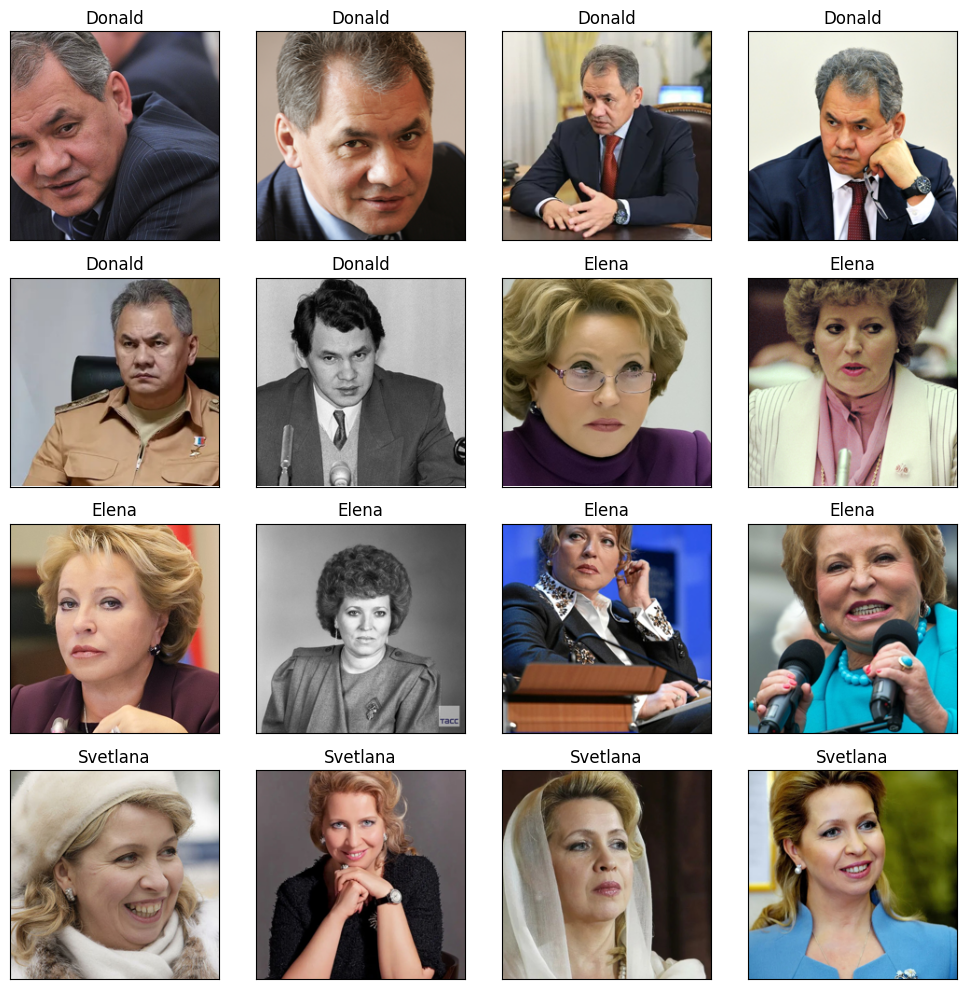

In [17]:
plt.figure(figsize=(10, 10))

# Show all images from the dataset since our dataset is small
for idx, (image, label_idx) in enumerate(dataset):
    cur_class = class_names[label_idx]

    plt.subplot(4, 4, idx+1)
    plt.imshow(denormalize_image(image).permute(1, 2, 0))
    plt.title(f"{cur_class}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

# Perform classification

Let's perform the classification with our out of the box labels.

In [18]:
# read out all images and true labels
image_input, y_true = next(iter(data_batches))
image_input = image_input.to(device)

with torch.no_grad():
    image_features = model.encode_image(image_input).float()


In [19]:
def show_results(image_features, text_features, class_names):
    # depends on global var dataset

    text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    k = np.min([len(class_names), 5])
    # top_probs, top_labels = text_probs.cpu().topk(k, dim=-1)
    text_probs = text_probs.cpu()

    plt.figure(figsize=(26, 16))

    for i, (image, label_idx) in enumerate(dataset):
        plt.subplot(4, 8, 2 * i + 1)
        plt.imshow(denormalize_image(image).permute(1, 2, 0))
        plt.axis("off")

        plt.subplot(4, 8, 2 * i + 2)
        y = np.arange(k)
        plt.grid()
        plt.barh(y, text_probs[i])
        plt.gca().invert_yaxis()
        plt.gca().set_axisbelow(True)
        # plt.yticks(y, [class_names[index] for index in top_labels[i].numpy()])
        plt.yticks(y, class_names)
        plt.xlabel("probability")

    plt.subplots_adjust(wspace=0.5)
    plt.show()

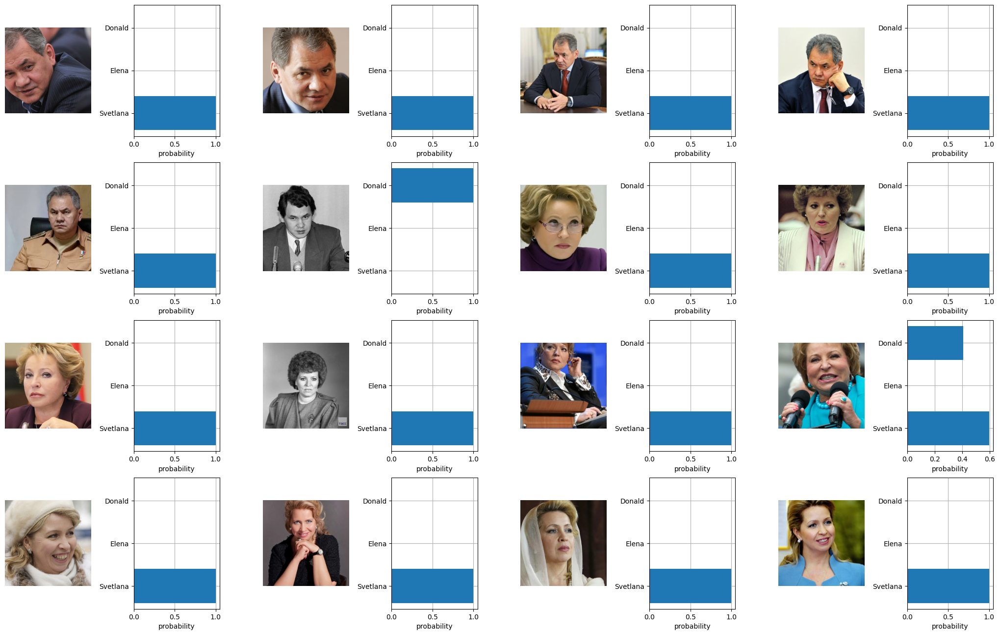

In [20]:
show_results(image_features, text_features, class_names)

You can see that CLIP is not doing great with these labels.

Let's play with the labels a bit and see if it changes anything.

# Experiments

Below we will try to change lables to see how it affects the results.

## Change names to more common in the US

Let's change names to a more common names in the US. CLIP was supposedly trained on English language corpus and didn't encounter much of Russian names (this is a guess).

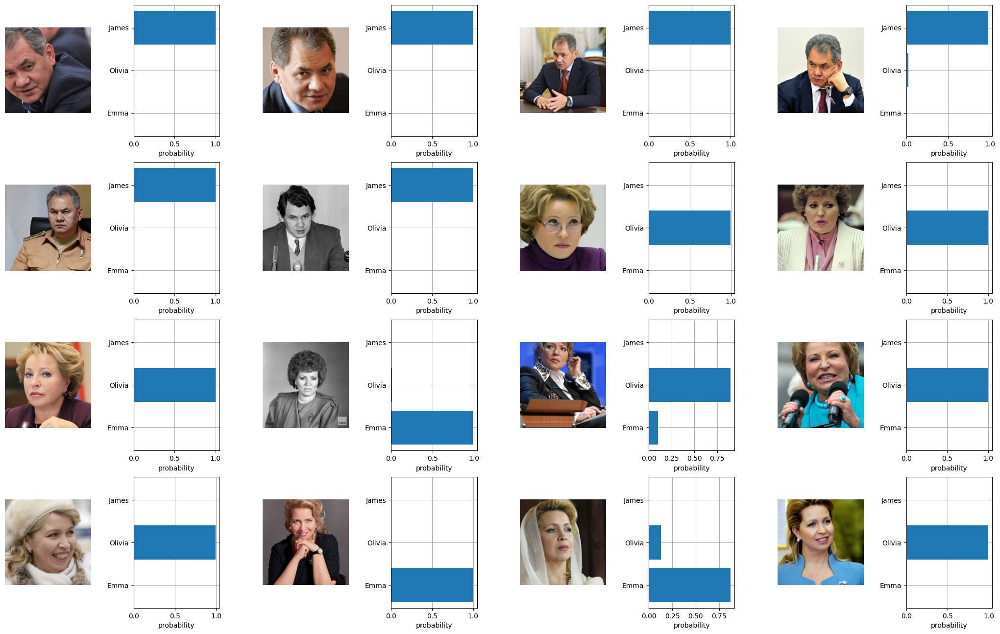

In [21]:
class_names = ['James', 'Olivia', 'Emma']
class_captions = [f"An image depicting a {x}" for x in class_names]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)

Much, much better!

Looks like we can classify male/female easily. Let's have a look.

## Male/female classification


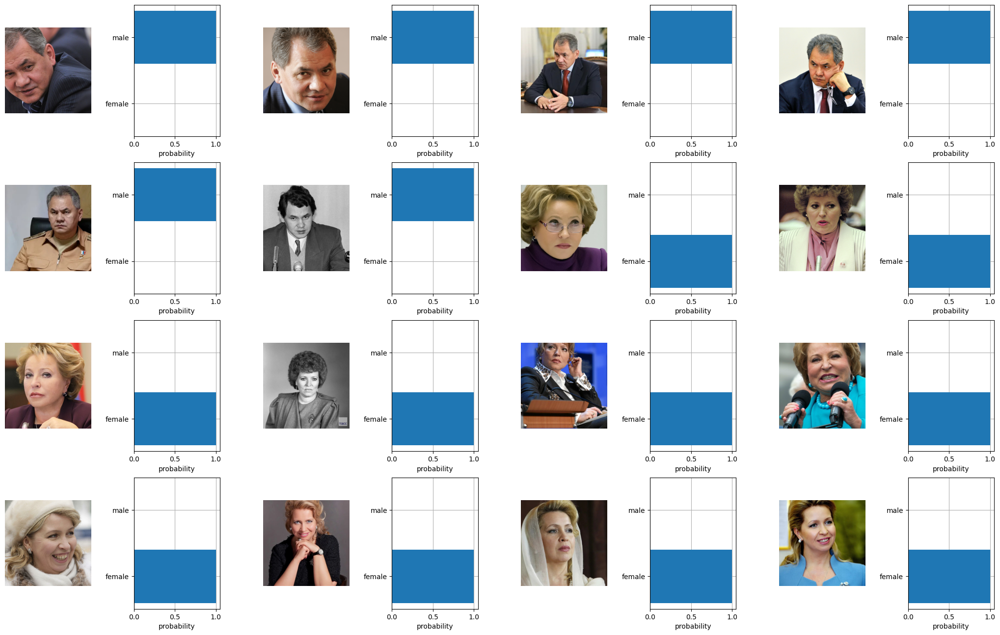

In [22]:
class_names = ['male', 'female']
class_captions = [f"An image depicting a {x}" for x in class_names]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)

That was pretty accurate. Next step in this direction will be to test it on other ethnicities.

## Object detection/presence?

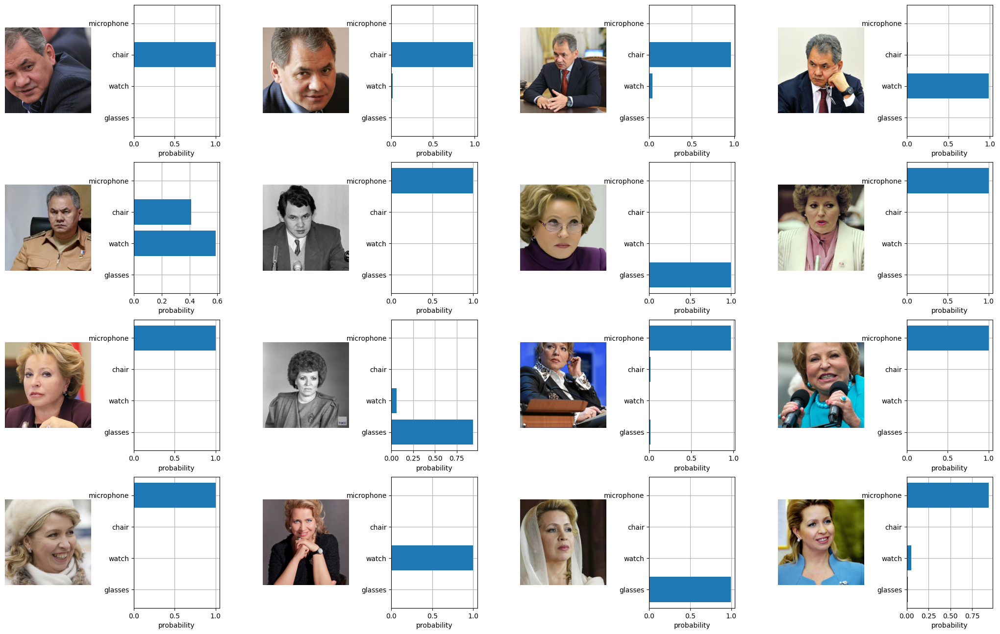

In [23]:
class_names = ['microphone', 'chair', 'watch', 'glasses']
class_captions = [f"An image showing a {x}" for x in class_names]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)

## Objects counting by words and digits

Since we have at least one image with two microphones, I wanted to see if CLIP can detect it. We test both variants: `two` and `2`.

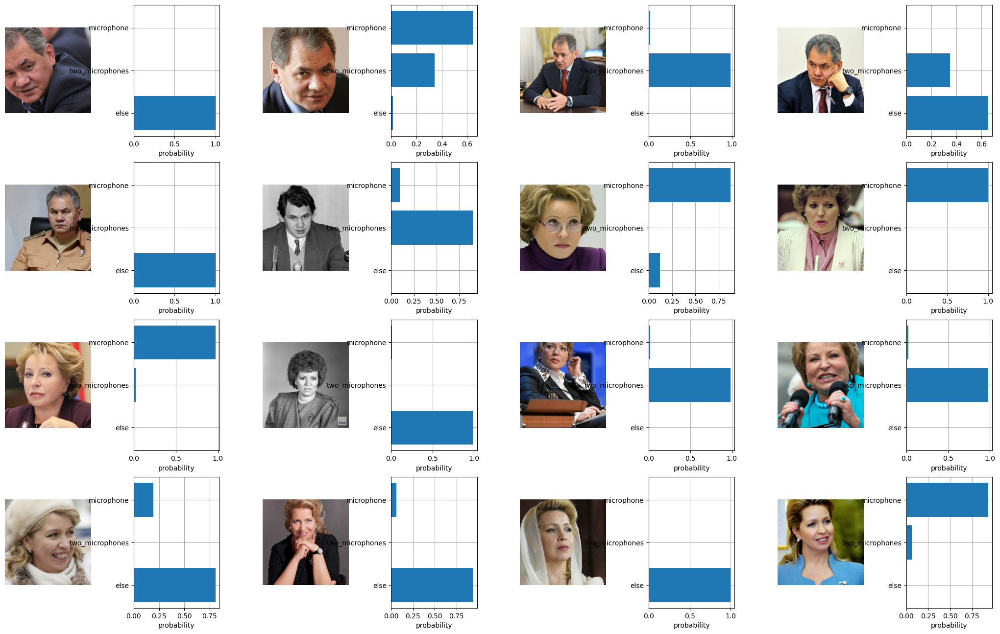

In [24]:
class_names = ['microphone', 'two_microphones', "else"]
class_captions = ["An image showing a microphone", "An image showing two microphones", "An image showing something else"]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)

We can also see that words description is better than digits-based. Compare above image in row 3 column 4 to the one below:

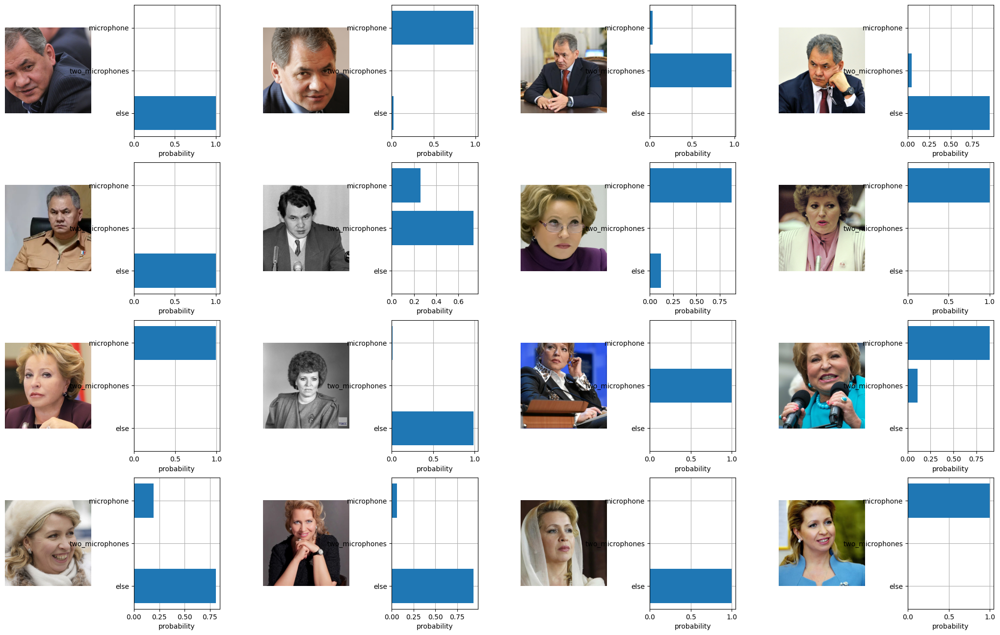

In [25]:
class_names = ['microphone', 'two_microphones', "else"]
class_captions = ["An image showing a microphone", "An image showing 2 microphones", "An image showing something else"]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)

## Find suitable name for good feature separation

Playing with the names a bit, I found a combination, which allows to distinguish between two females. Combinations that I've tried:

* Sophia, Emma
* Anna, Emma



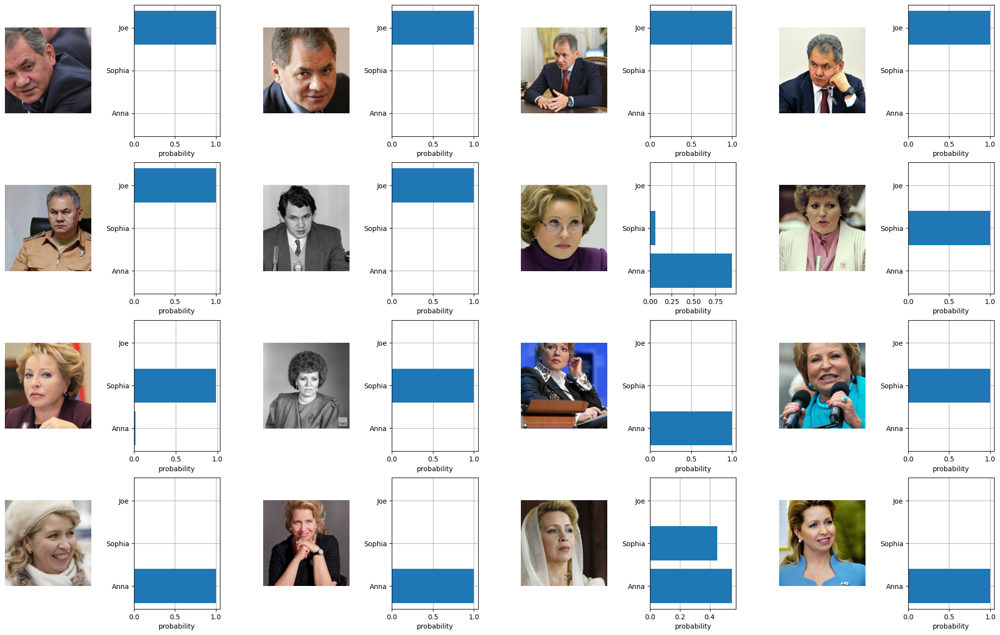

In [26]:
class_names = ['Joe', 'Sophia', 'Anna']
class_captions = [f"A photo of {x}" for x in class_names]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)

## Add conditions to class descriptions

The idea here is that we add a condition in text description. For this small dataset this is very fragile. The combination bellow works OK, but try to change `Sophia` to something else and the results won't be so good.

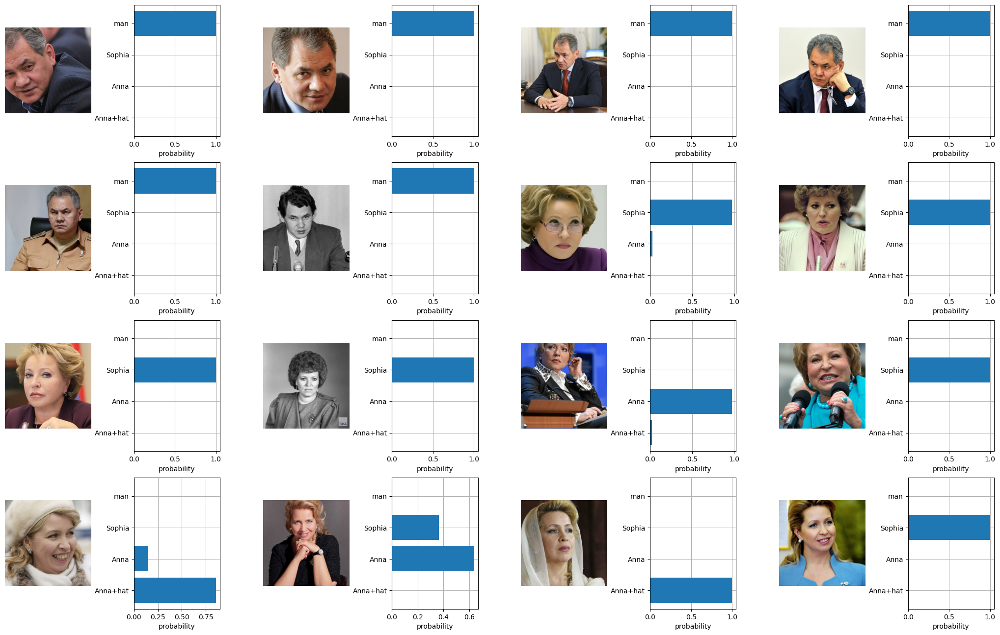

In [27]:
class_names = ["man", "Sophia", "Anna", "Anna+hat"]
class_captions = ["A photo of a man", "A photo of Sophia", "A photo of a Anna", "A photo of a Anna with head covered"]
text_input = clip.tokenize(class_captions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_input).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

show_results(image_features, text_features, class_names)